## The National Centers for Environmental Information (NCEI) 



In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import geopandas as gpd
import folium

In [4]:
df=pd.read_csv('temperature (1) (1) (1) (1) (1) (1).csv')

In [6]:
df.head(11)

,ID,Date,Element,Data_Value
0,USW00094889,2014-11-12,TMAX,22
1,USC00208972,2009-04-29,TMIN,56
2,USC00200032,2008-05-26,TMAX,278
3,USC00205563,2005-11-11,TMAX,139
4,USC00200230,2014-02-27,TMAX,-106
5,USW00014833,2010-10-01,TMAX,194
6,USC00207308,2010-06-29,TMIN,144
7,USC00203712,2005-10-04,TMAX,289
8,USW00004848,2007-12-14,TMIN,-16
9,USC00200220,2011-04-21,TMAX,72


In [24]:
df['Date']=pd.to_datetime(df['Date'])
df['Year']=df['Date'].dt.year
df['DayOfYear']=df['Date'].dt.strftime('%j').astype(int)

In [25]:
df=df[df['DayOfYear']!=60]

In [26]:
df.head(11)

,ID,Date,Element,Data_Value,Year,DayOfYear
0,USW00094889,2014-11-12,TMAX,22,2014,316
1,USC00208972,2009-04-29,TMIN,56,2009,119
2,USC00200032,2008-05-26,TMAX,278,2008,147
3,USC00205563,2005-11-11,TMAX,139,2005,315
4,USC00200230,2014-02-27,TMAX,-106,2014,58
5,USW00014833,2010-10-01,TMAX,194,2010,274
6,USC00207308,2010-06-29,TMIN,144,2010,180
7,USC00203712,2005-10-04,TMAX,289,2005,277
8,USW00004848,2007-12-14,TMIN,-16,2007,348
9,USC00200220,2011-04-21,TMAX,72,2011,111


In [16]:
##Seperate 2005-2014 &2015

In [27]:
histo_data=df[(df['Year']>=2005) & (df['Year']<=2014)]
year_2015=df[df['Year']==2015]

In [23]:
## Record High & Low

In [30]:
record_high=histo_data.groupby('DayOfYear')['Element'].max()
record_low=histo_data.groupby('DayOfYear')['Element'].min()

In [ ]:
##Record breaking point

In [38]:
high_breakers=year_2015[year_2015['Element']> record_high.loc[year_2015['DayOfYear']].values]

In [40]:
low_breakers=year_2015[year_2015['Element']< record_low.loc[year_2015['DayOfYear']].values]

In [44]:
##Plot Line Graph shaded area

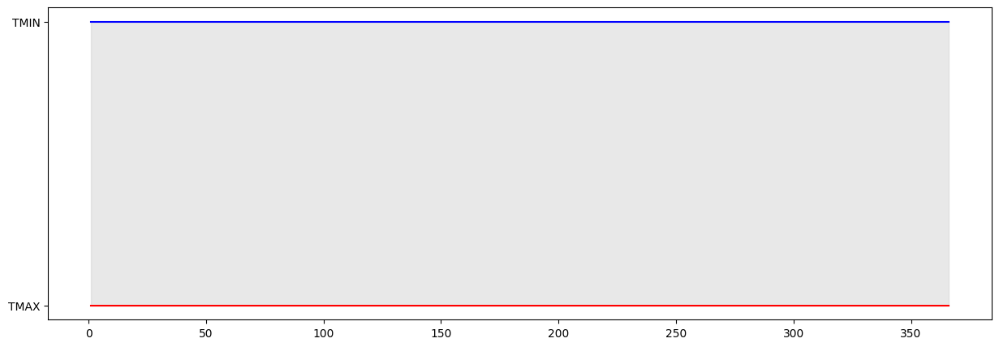

In [87]:
plt.figure(figsize=(15,5))
plt.plot(record_high.index,record_low.values,color='red',label='Record High(2005-2014)')
plt.plot(record_low.index,record_high.values,color='blue',label='Record Low(2005-2014)')
plt.fill_between(record_high.index,record_high.values,record_low.values,color='lightgrey',alpha=0.5,label='Range')

In [53]:
##Overlay scatter points


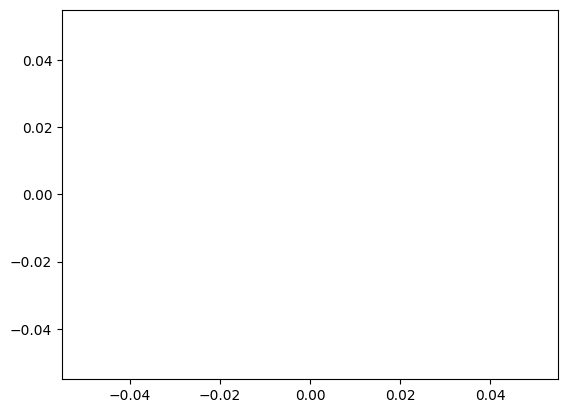

In [83]:
plt.scatter(high_breakers['DayOfYear'], high_breakers['Element'], color='darkred', label='Record High Broken (2015)')
plt.scatter(low_breakers['DayOfYear'], low_breakers['Element'], color='darkblue', label='Record Low Broken (2015)')

In [57]:
## Add Labels,legends and formatting

C:\Users\sreen\AppData\Local\Temp\ipykernel_16088\915323797.py:4: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(fontsize=12)


AttributeError: 'MonthLocator' object has no attribute 'format'

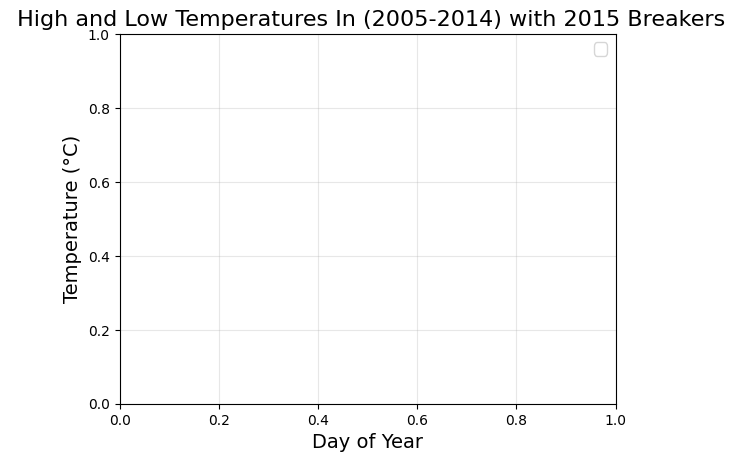

In [60]:
plt.title(' High and Low Temperatures In (2005-2014) with 2015 Breakers', fontsize=16)
plt.xlabel('Day of Year', fontsize=14)
plt.ylabel('Temperature (°C)', fontsize=14)
plt.legend(fontsize=12)
plt.grid(alpha=0.3)
plt.xticks(np.linspace(0, 365, 12), labels=mdates.MonthLocator().format(), rotation=45)

plt.show()

In [61]:
##Plot location on map

In [62]:
Stations=pd.read_csv('BinSize (1) (1) (1) (1) (1) (1).csv')

In [64]:
Stations.head(4)

,ID,LATITUDE,LONGITUDE,ELEVATION,STATE,NAME,GSNFLAG,HCNFLAG,WMOID,x,y,x_group,y_group,xy_group,hash
0,AE000041196,25.333,55.517,34.0,NaN,SHARJAH INTER. AIRP,GSN,NaN,41196.0,5.579578e+06,2.816905e+06,5497601.479782179 to 5594934.908498545,2772265.475723952 to 2869598.904440318,"5497601.479782179 to 5594934.908498545, 277226...",1f6f0e89f4e937d934fe9acde2545e0d66bbcfe3b66320...
1,AEM00041194,25.255,55.364,10.4,NaN,DUBAI INTL,NaN,NaN,41194.0,5.567782e+06,2.808232e+06,5497601.479782179 to 5594934.908498545,2772265.475723952 to 2869598.904440318,"5497601.479782179 to 5594934.908498545, 277226...",1f6f0e89f4e937d934fe9acde2545e0d66bbcfe3b66320...
2,AEM00041217,24.433,54.651,26.8,NaN,ABU DHABI INTL,NaN,NaN,41217.0,5.532707e+06,2.716829e+06,5497601.479782179 to 5594934.908498545,2674932.047007587 to 2772265.4757239525,"5497601.479782179 to 5594934.908498545, 267493...",35c9093084d26708afc5b482ea15ba52e3f20fb7cd781f...
3,AEM00041218,24.262,55.609,264.9,NaN,AL AIN INTL,NaN,NaN,41218.0,5.637301e+06,2.697815e+06,5594934.908498544 to 5692268.33721491,2674932.047007587 to 2772265.4757239525,"5594934.908498544 to 5692268.33721491, 2674932...",2a6a7edad90579049fd1b3c3a990e8a8be90cb1975118e...


In [66]:
gdf = gpd.GeoDataFrame(Stations, geometry=gpd.points_from_xy(Stations['LONGITUDE'],Stations['LATITUDE']))

In [67]:
gdf

,ID,LATITUDE,LONGITUDE,ELEVATION,STATE,NAME,GSNFLAG,HCNFLAG,WMOID,x,y,x_group,y_group,xy_group,hash,geometry
0,AE000041196,25.333,55.517,34.0,NaN,SHARJAH INTER. AIRP,GSN,NaN,41196.0,5.579578e+06,2.816905e+06,5497601.479782179 to 5594934.908498545,2772265.475723952 to 2869598.904440318,"5497601.479782179 to 5594934.908498545, 277226...",1f6f0e89f4e937d934fe9acde2545e0d66bbcfe3b66320...,POINT (55.517 25.333)
1,AEM00041194,25.255,55.364,10.4,NaN,DUBAI INTL,NaN,NaN,41194.0,5.567782e+06,2.808232e+06,5497601.479782179 to 5594934.908498545,2772265.475723952 to 2869598.904440318,"5497601.479782179 to 5594934.908498545, 277226...",1f6f0e89f4e937d934fe9acde2545e0d66bbcfe3b66320...,POINT (55.364 25.255)
2,AEM00041217,24.433,54.651,26.8,NaN,ABU DHABI INTL,NaN,NaN,41217.0,5.532707e+06,2.716829e+06,5497601.479782179 to 5594934.908498545,2674932.047007587 to 2772265.4757239525,"5497601.479782179 to 5594934.908498545, 267493...",35c9093084d26708afc5b482ea15ba52e3f20fb7cd781f...,POINT (54.651 24.433)
3,AEM00041218,24.262,55.609,264.9,NaN,AL AIN INTL,NaN,NaN,41218.0,5.637301e+06,2.697815e+06,5594934.908498544 to 5692268.33721491,2674932.047007587 to 2772265.4757239525,"5594934.908498544 to 5692268.33721491, 2674932...",2a6a7edad90579049fd1b3c3a990e8a8be90cb1975118e...,POINT (55.609 24.262)
4,AFM00040990,31.500,65.850,1010.0,NaN,KANDAHAR AIRPORT,NaN,NaN,40990.0,6.243199e+06,3.502645e+06,6178935.480796736 to 6276268.909513102,3453599.476738509 to 3550932.9054548745,"6178935.480796736 to 6276268.909513102, 345359...",039e75bbef55baa3fecc0568dc3b245666a98b1bcba6b4...,POINT (65.85 31.5)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18254,ZA000067633,-15.250,23.150,1053.0,NaN,MONGU,GSN,NaN,67633.0,2.483523e+06,-1.695725e+06,2480265.1895748563 to 2577598.618291222,-1705072.2452288494 to -1607738.8165124834,"2480265.1895748563 to 2577598.618291222, -1705...",c1f39870d7200ac9fa7748c4d6688cbbe48cd3ac4c4a9e...,POINT (23.15 -15.25)
18255,ZA000067743,-17.817,25.817,986.0,NaN,LIVINGSTONE,GSN,NaN,67743.0,2.733040e+06,-1.981163e+06,2674932.047007587 to 2772265.4757239525,-1997072.531377945 to -1899739.1026615791,"2674932.047007587 to 2772265.4757239525, -1997...",25cba19cddf24c1999b6b8812cbccbb2fc8f3e64715d73...,POINT (25.817 -17.817)
18256,ZI000067775,-17.917,31.133,1480.0,NaN,HARARE (KUTSAGA),GSN,NaN,67775.0,3.293948e+06,-1.992282e+06,3258932.6193057783 to 3356266.048022144,-1997072.531377945 to -1899739.1026615791,"3258932.6193057783 to 3356266.048022144, -1997...",6c7f11051d64bc4f778b4d2417b11ec72b4f655aed5fea...,POINT (31.133 -17.917)
18257,ZI000067975,-20.067,30.867,1095.0,NaN,MASVINGO,NaN,NaN,67975.0,3.223893e+06,-2.231352e+06,3161599.190589413 to 3258932.6193057788,-2289072.817527041 to -2191739.388810675,"3161599.190589413 to 3258932.6193057788, -2289...",1d695305fb4a37e8903ca1b196f14d940b84cbc1c31d4b...,POINT (30.867 -20.067)


In [89]:
ann_arbor_map=folium.Map(location=[42.2808,-85.7430],zoom_start=10)

In [90]:
ann_arbor_map

In [82]:
Stations.head(5)

,ID,LATITUDE,LONGITUDE,ELEVATION,STATE,NAME,GSNFLAG,HCNFLAG,WMOID,x,y,x_group,y_group,xy_group,hash
0,AE000041196,25.333,55.517,34.0,NaN,SHARJAH INTER. AIRP,GSN,NaN,41196.0,5.579578e+06,2.816905e+06,5497601.479782179 to 5594934.908498545,2772265.475723952 to 2869598.904440318,"5497601.479782179 to 5594934.908498545, 277226...",1f6f0e89f4e937d934fe9acde2545e0d66bbcfe3b66320...
1,AEM00041194,25.255,55.364,10.4,NaN,DUBAI INTL,NaN,NaN,41194.0,5.567782e+06,2.808232e+06,5497601.479782179 to 5594934.908498545,2772265.475723952 to 2869598.904440318,"5497601.479782179 to 5594934.908498545, 277226...",1f6f0e89f4e937d934fe9acde2545e0d66bbcfe3b66320...
2,AEM00041217,24.433,54.651,26.8,NaN,ABU DHABI INTL,NaN,NaN,41217.0,5.532707e+06,2.716829e+06,5497601.479782179 to 5594934.908498545,2674932.047007587 to 2772265.4757239525,"5497601.479782179 to 5594934.908498545, 267493...",35c9093084d26708afc5b482ea15ba52e3f20fb7cd781f...
3,AEM00041218,24.262,55.609,264.9,NaN,AL AIN INTL,NaN,NaN,41218.0,5.637301e+06,2.697815e+06,5594934.908498544 to 5692268.33721491,2674932.047007587 to 2772265.4757239525,"5594934.908498544 to 5692268.33721491, 2674932...",2a6a7edad90579049fd1b3c3a990e8a8be90cb1975118e...
4,AFM00040990,31.500,65.850,1010.0,NaN,KANDAHAR AIRPORT,NaN,NaN,40990.0,6.243199e+06,3.502645e+06,6178935.480796736 to 6276268.909513102,3453599.476738509 to 3550932.9054548745,"6178935.480796736 to 6276268.909513102, 345359...",039e75bbef55baa3fecc0568dc3b245666a98b1bcba6b4...


In [91]:
for _, row in gdf.iterrows():
    folium.Marker([row['LATITUDE'], row['LONGITUDE']], popup=row['hash']).add_to(ann_arbor_map)

ann_arbor_map.save("ann_arbor_stations_map.html")

In [92]:
ann_arbor_map

In [93]:
## Temperature Summary

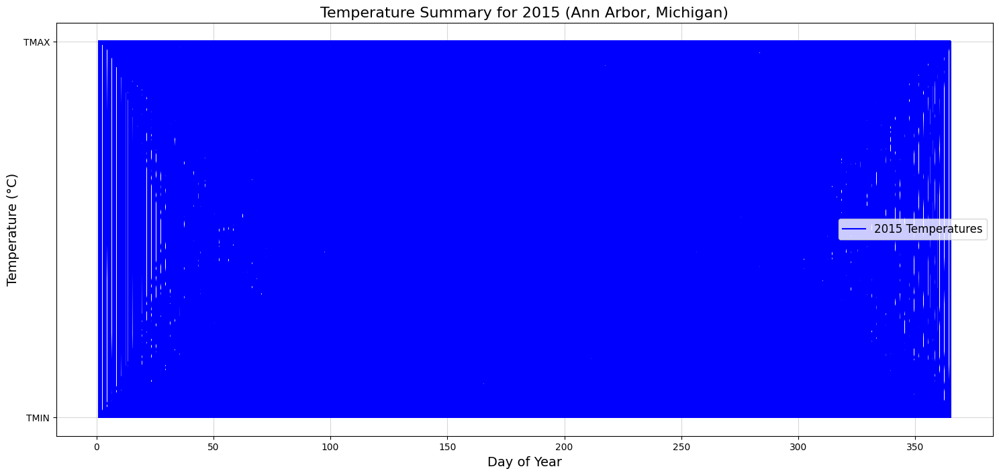

In [102]:
plt.figure(figsize=(18,8))
plt.plot(year_2015['DayOfYear'], year_2015['Element'], label='2015 Temperatures', color='blue')
plt.title('Temperature Summary for 2015 (Ann Arbor, Michigan)', fontsize=16)
plt.xlabel('Day of Year', fontsize=14)
plt.ylabel('Temperature (°C)', fontsize=14)
plt.grid(alpha=0.5)
plt.legend(fontsize=12)
plt.show()